In [1]:
! pip install pytesseract
! pip install opencv-python 

In [2]:
import requests
import pytesseract
import cv2
from PIL import Image 
from IPython.display import HTML, clear_output
import numpy as np 
import pandas as pd 
import matplotlib as plt

#

In [3]:
img = Image.open('/Users/krushna/Downloads/1688750-William-Shakespeare-Quote-One-travels-long-distances-not-solely.jpg')
img_path = '/Users/krushna/Downloads/3ae888f0-05dc-43ce-9184-e6681b0ba565.jpeg'
img.resize((100,100))
img.save("new_img.jpeg")

In [4]:
#Extract 
custom_config = ' -l eng --oem 3 --psm 6'
my_extract_text = pytesseract.image_to_string(img, config = custom_config)
print(my_extract_text)

One travels long distances not solely for large
gatnerings, but for something more intangiole. |
nave always gone out on a limb for love. A fi
Gangerous, romantic, disappointing way to livg

Jennifer Ball



In [5]:
# Remove irregular symbols 
try:
    remove_char = "()@-*""/,+=*|^&~`"
    temp = my_extract_text
    for char in remove_char:
        temp = temp.replace(char, "")
    print(temp)
except IOError as e:
    print("Error (%s)" %e)
    
    

One travels long distances not solely for large
gatnerings but for something more intangiole. 
nave always gone out on a limb for love. A fi
Gangerous romantic disappointing way to livg

Jennifer Ball



In [6]:
# Opencv
img_data = cv2.imread('/Users/krushna/Downloads/1688750-William-Shakespeare-Quote-One-travels-long-distances-not-solely.jpg')

In [7]:
def transform_greyscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray_image = transform_greyscale(img_data)
gray_image

array([[205, 205, 204, ..., 249, 248, 248],
       [204, 203, 203, ..., 249, 248, 248],
       [204, 204, 204, ..., 249, 249, 248],
       ...,
       [108, 106, 105, ...,  53,  53,  53],
       [110, 108, 106, ...,  53,  53,  53],
       [110, 108, 106, ...,  53,  53,  53]], dtype=uint8)

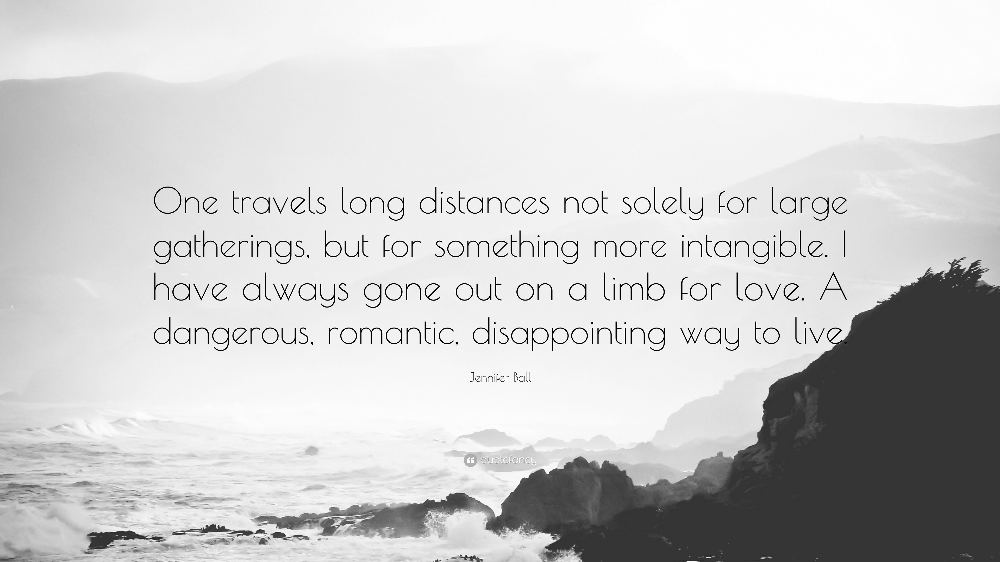

In [8]:
Image.fromarray(gray_image)

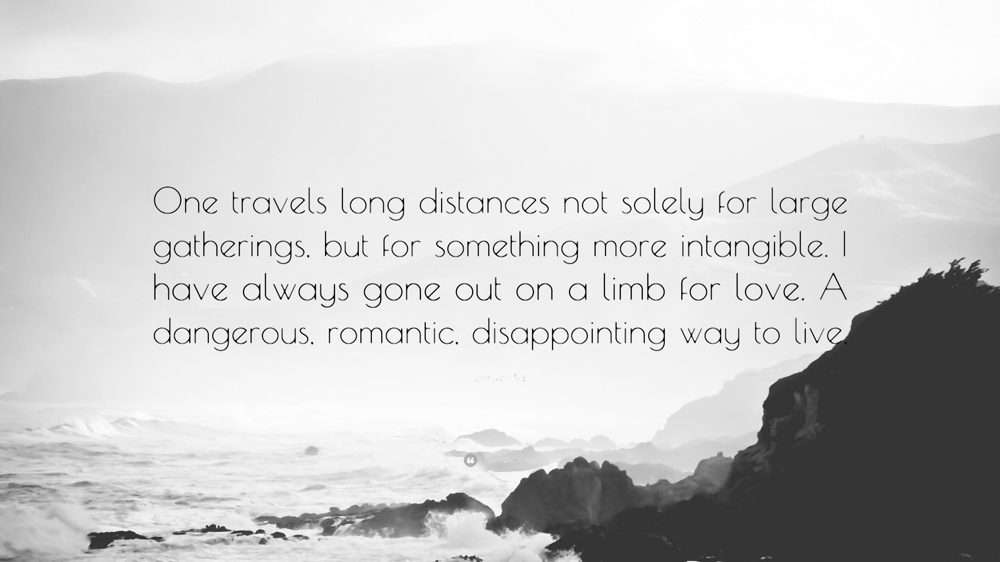

In [9]:
# noise removal
def noise_removal(image):
    return  cv2.medianBlur(image,7)

noise_removal_image = noise_removal(gray_image)
Image.fromarray(noise_removal_image)

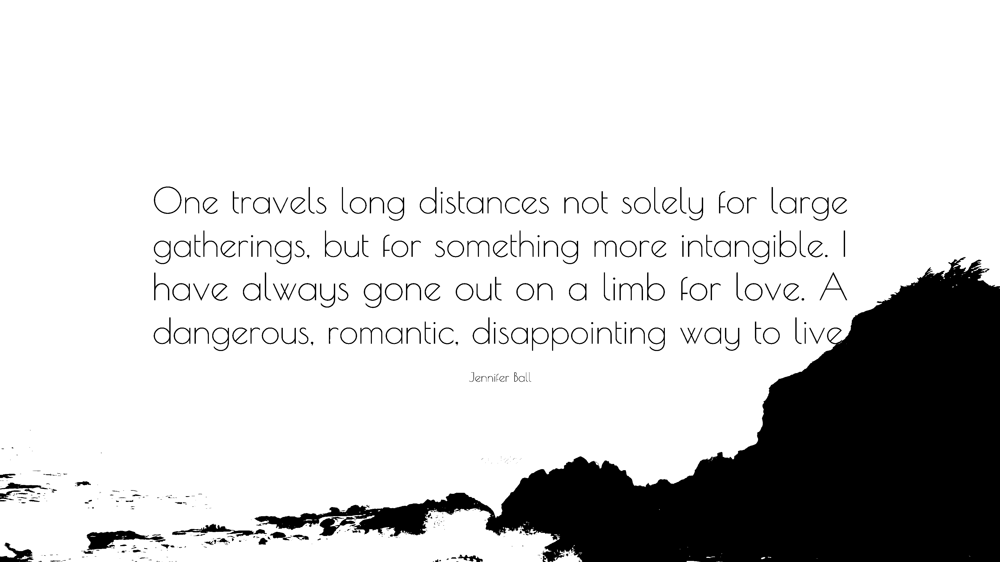

In [10]:
# Threshold tarnsformation 
def threshold_transform(image):
    return cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

threshold_image = threshold_transform(gray_image)
Image.fromarray(threshold_image)

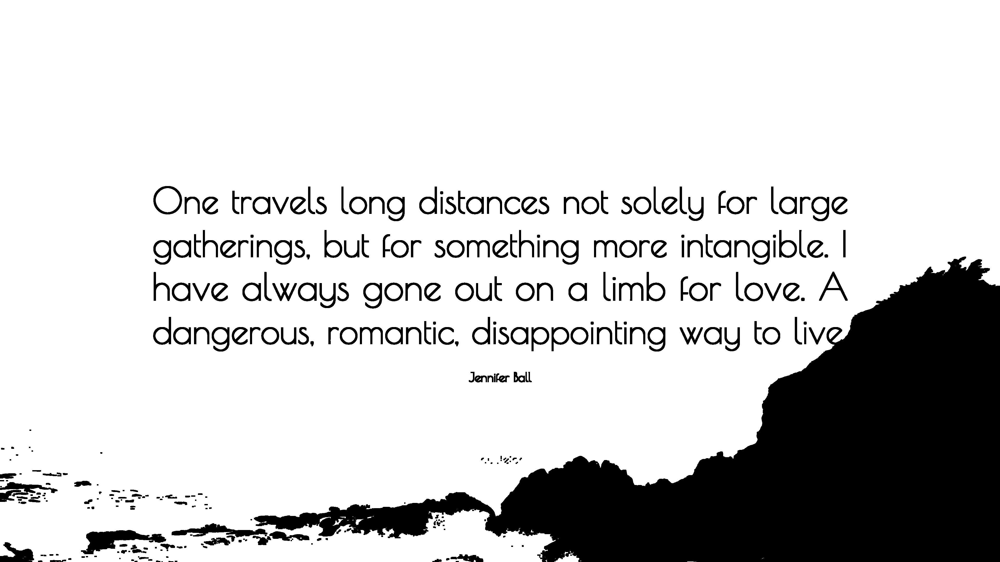

In [11]:
# Erosion tarsnformation 
def erode_image(image):
    kernal = np.ones((5,5),np.uint8)
    return cv2.erode(image, kernal, iterations =1)

erode =  erode_image(threshold_image)
Image.fromarray(erode)
    

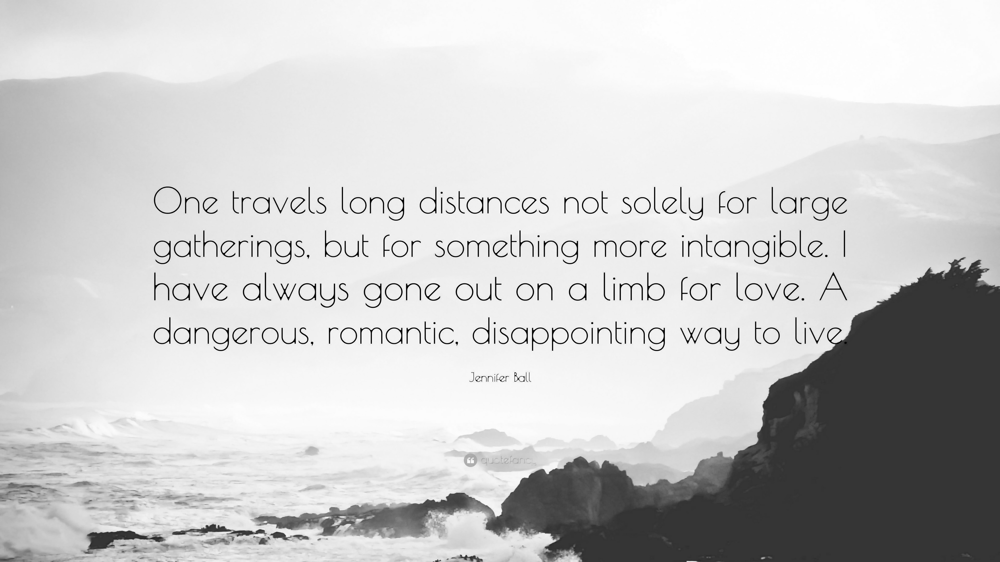

In [12]:
# morphology transfomation 
def morph_image(image):
    kernal = np.ones((5,5), np.uint8)
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernal )

morph_image = morph_image(gray_image)
Image.fromarray(morph_image)

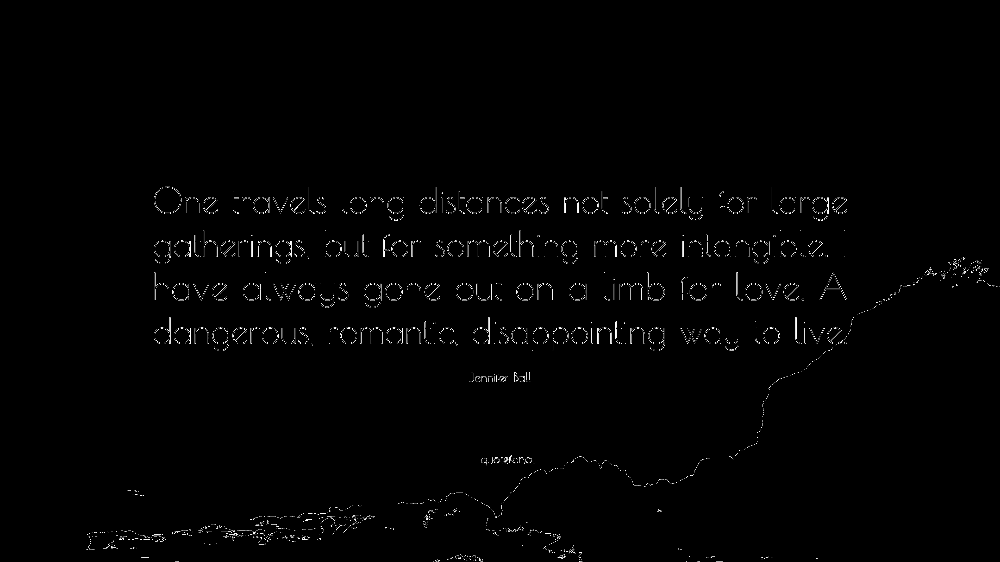

In [13]:
# Canny Edge detection
def canny_edge(image):
    return cv2.Canny(image, 100, 500)

canny_image = canny_edge(gray_image)
Image.fromarray(canny_image)


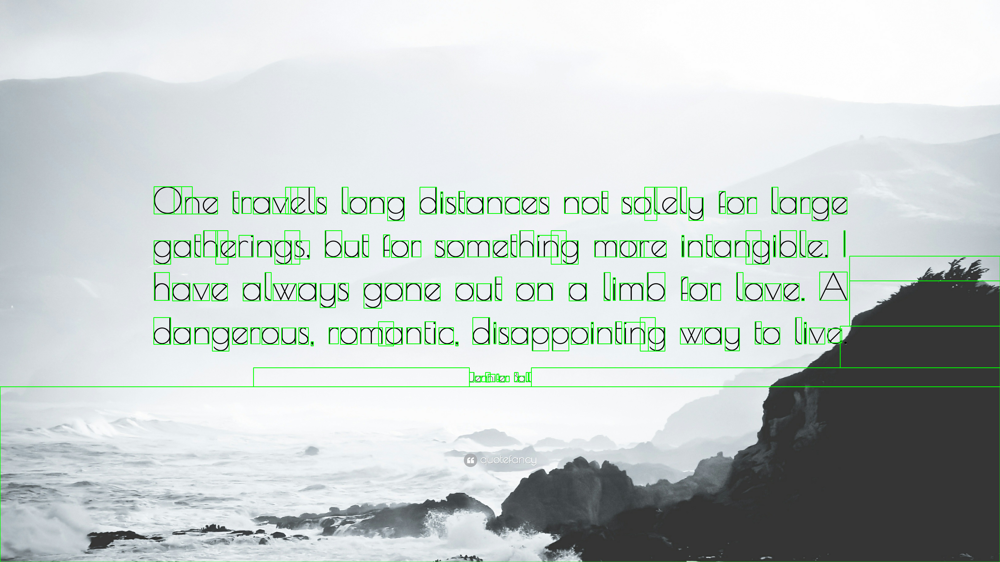

In [14]:
# Bouding box
# pytesseract.image_to_boxes returns 
# Character
# x-coordinate of the bottom-left corner
# y-coordinate of the bottom-left corner
# x-coordinate of the top-right corner
# y-coordinate of the top-right corner
# Page number (usually 0)


# Convert the coordinates from string to integer and adjust the 
# y-coordinates. pytesseract provides coordinates with the origin at 
# the bottom-left corner, while OpenCV uses the top-left corner as the 
# origin. Therefore, the y-coordinates need to be adjusted by 
#subtracting them from the image height (h).

box_image = cv2.imread('/Users/krushna/Downloads/1688750-William-Shakespeare-Quote-One-travels-long-distances-not-solely.jpg')
h,w,c = box_image.shape
boxes = pytesseract.image_to_boxes(box_image)
for b in boxes.splitlines():
    b = b.split(' ')
    x1, y1, x2, y2 = int(b[1]), h - int(b[2]), int(b[3]), h - int(b[4])
    box_image = cv2.rectangle(box_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

box_image = cv2.cvtColor(box_image, cv2.COLOR_BGR2RGB)
Image.fromarray(box_image)

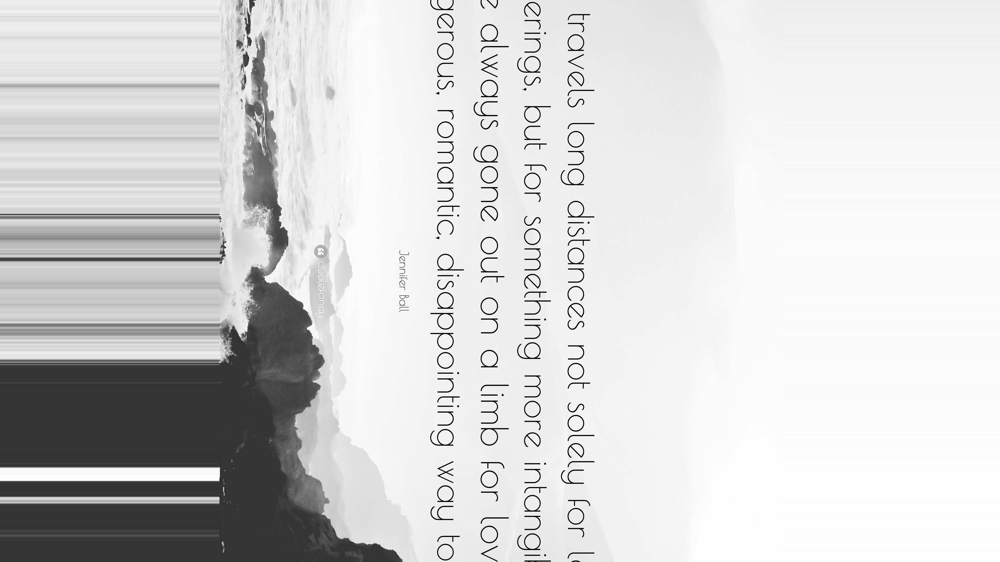

In [15]:
# Skew- correction
def skew_correction(image):
    coords = np.column_stack(np.where(image> 0 ))
    angle  = cv2.minAreaRect(coords)[-1]
    if angle< 45:
        angle = -(90+angle)
    else:
        angle = -angle
        h,w = image.shape[:2]
        center = (w//2, h//2)
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated = cv2.warpAffine(image, M, (w,h), flags = cv2.INTER_CUBIC, borderMode = cv2.BORDER_REPLICATE)
        return rotated

rotate = skew_correction(gray_image)
Image.fromarray(rotate)

In [16]:
# template matching 
def match_template(image, template):
    return cv2.matchTemplate(image, template, cv2.TM_CCOEFF_NORMED)

match_image = match_template(gray_image, gray_image)
